In [1]:
import orjson as json
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [2]:
for i, line in enumerate(open('../data/test_matches.jsonl')):
    game = json.loads(line)
    break

In [3]:
game['players'][0].keys()

dict_keys(['player_slot', 'hero_id', 'hero_name', 'account_id_hash', 'ability_upgrades', 'obs_placed', 'sen_placed', 'creeps_stacked', 'camps_stacked', 'rune_pickups', 'firstblood_claimed', 'teamfight_participation', 'towers_killed', 'roshans_killed', 'observers_placed', 'stuns', 'max_hero_hit', 'times', 'gold_t', 'lh_t', 'dn_t', 'xp_t', 'obs_log', 'sen_log', 'obs_left_log', 'sen_left_log', 'purchase_log', 'kills_log', 'buyback_log', 'runes_log', 'obs', 'sen', 'actions', 'pings', 'purchase', 'gold_reasons', 'xp_reasons', 'killed', 'item_uses', 'ability_uses', 'hero_hits', 'damage', 'damage_taken', 'damage_inflictor', 'runes', 'killed_by', 'kill_streaks', 'multi_kills', 'life_state', 'healing', 'damage_inflictor_received', 'randomed', 'pred_vict', 'gold', 'lh', 'xp', 'x', 'y', 'hero_inventory', 'hero_stash', 'health', 'max_health', 'max_mana', 'level', 'kills', 'deaths', 'assists', 'denies', 'nearby_creep_death_count'])

In [7]:
def draw_point(img, x, y, color, offset=5, scale=1024):
    """
    x, y - normalized coordinates
    """
    plot_x = x
    plot_y = 1 - y
    
    x = int(plot_x * scale)
    y = int(plot_y * scale)
    img[x-offset:x+offset,y-offset:y+offset] = color
    return img

def draw_players(players, scale=1024, offset=5, xmin=66.0, xmax=200.0, ymin=66.0, ymax=200.0, path_to_map='../dota_map.png'):
    if 'init_map' not in dir(draw_players):
        draw_players.init_map = np.array(Image.open(path_to_map))[...,:-1]
    map = draw_players.init_map.copy()
    xdenom = xmax - xmin
    ydenom = ymax - ymin
    for p in players:
        px = (p['x'] - xmin) / xdenom
        py = (p['y'] - ymin) / ydenom
        
        color = (255, 0, 0) if p['player_slot'] < 127 else (0, 255, 0)
        map = draw_point(map, px, py, color, offset=offset, scale=scale)
    
    x_rad, y_rad = 0.1, 0.1
    x_dire, y_dire = .9, .9
    
    map = draw_point(map, x_rad, y_rad, (255, 0, 0))
    map = draw_point(map, x_dire, y_dire, (0, 255, 0))
    
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(map)
    plt.show()

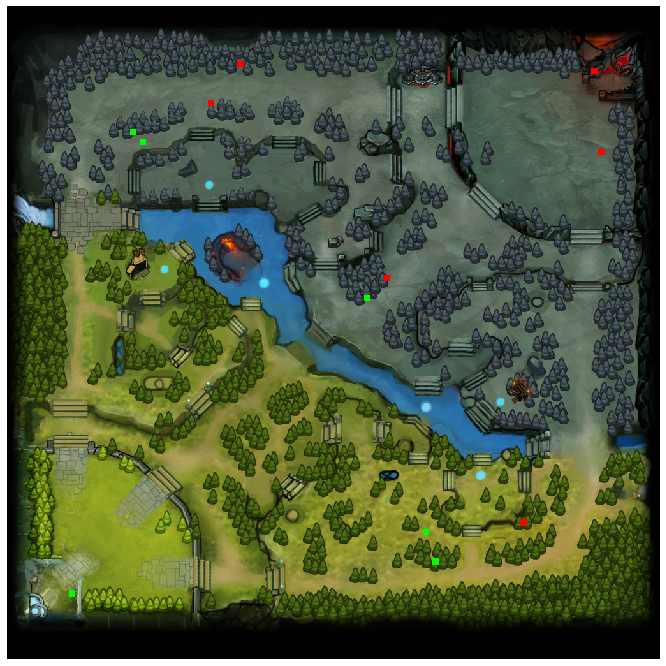

In [8]:
draw_players(game['players'])

In [9]:
radiant_base = (0.1, 0.1)
dire_base = (.9, .9)

In [10]:
import pandas as pd

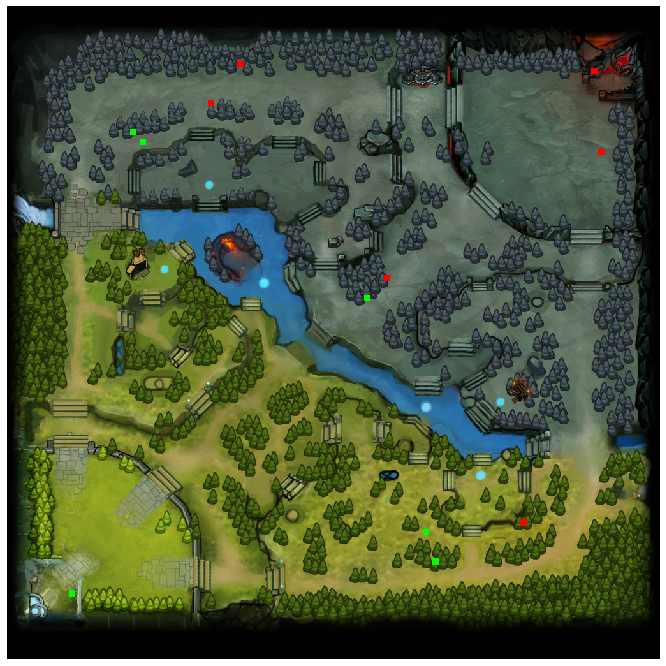

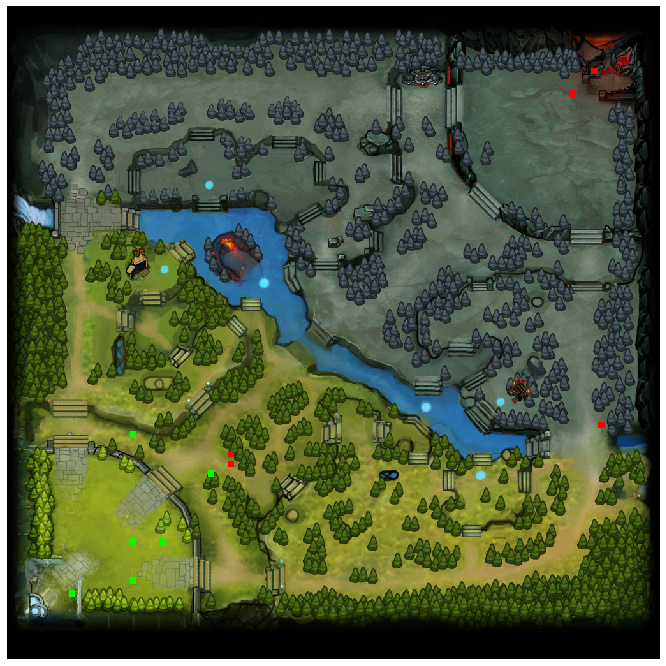

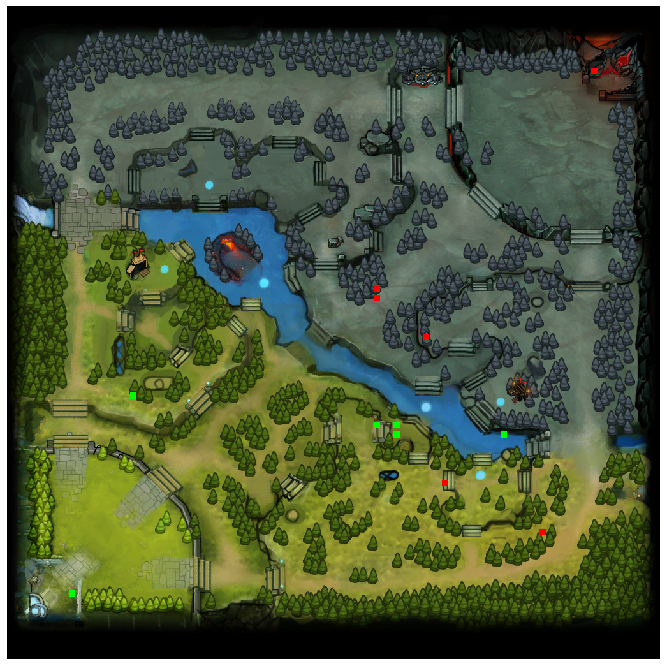

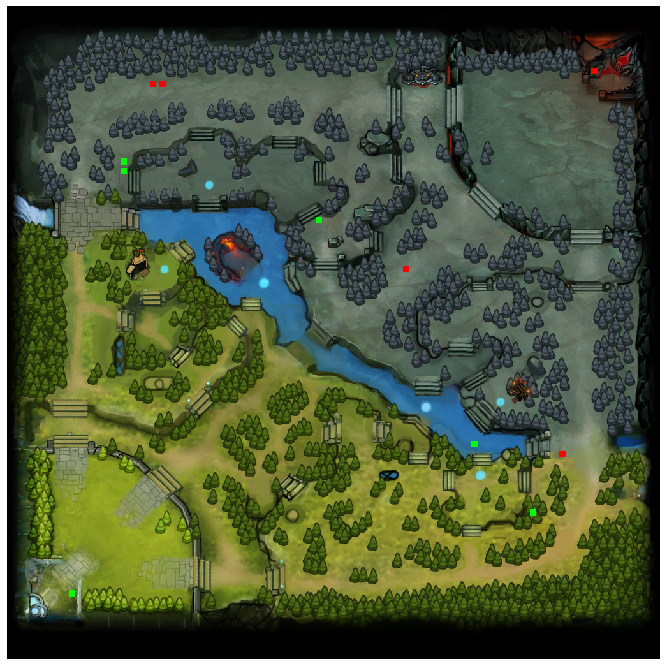

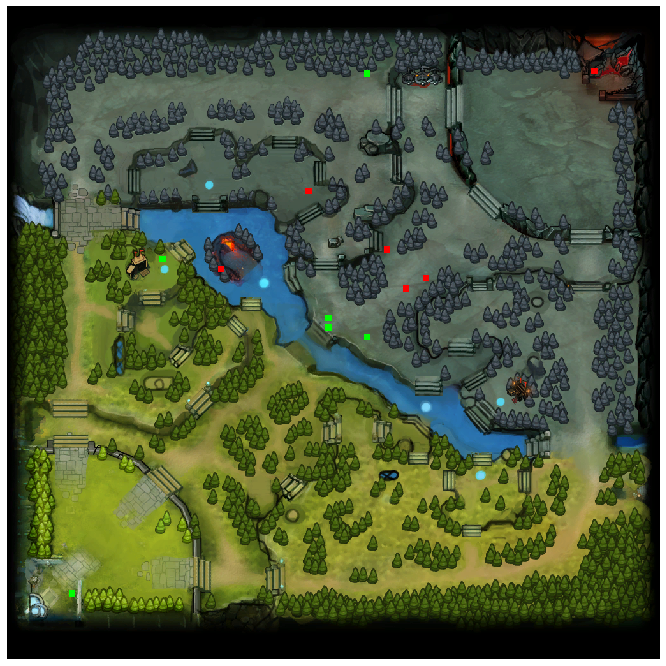

...

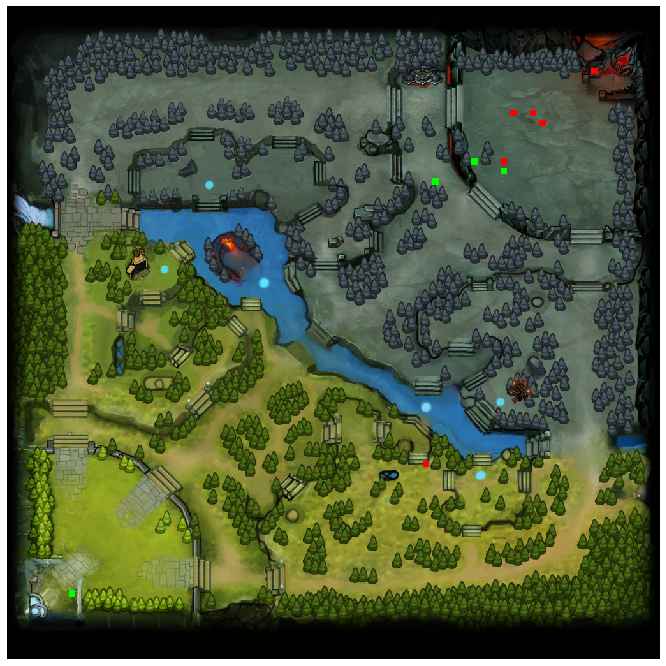

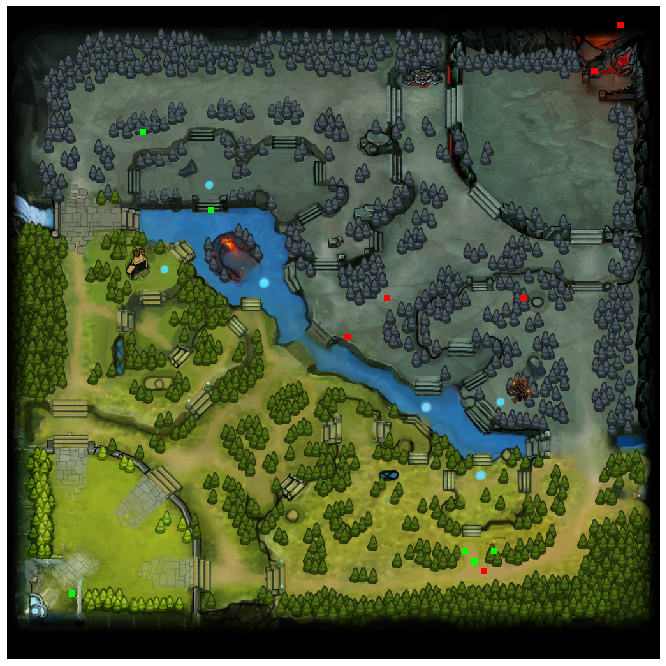

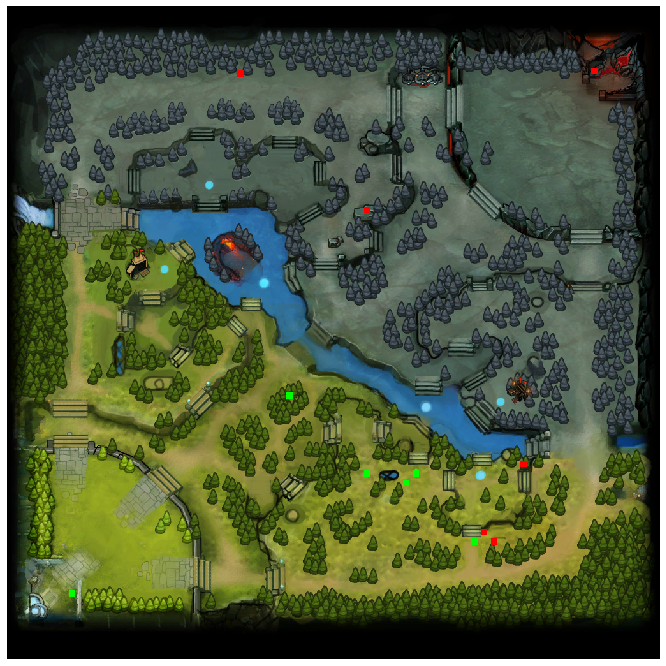

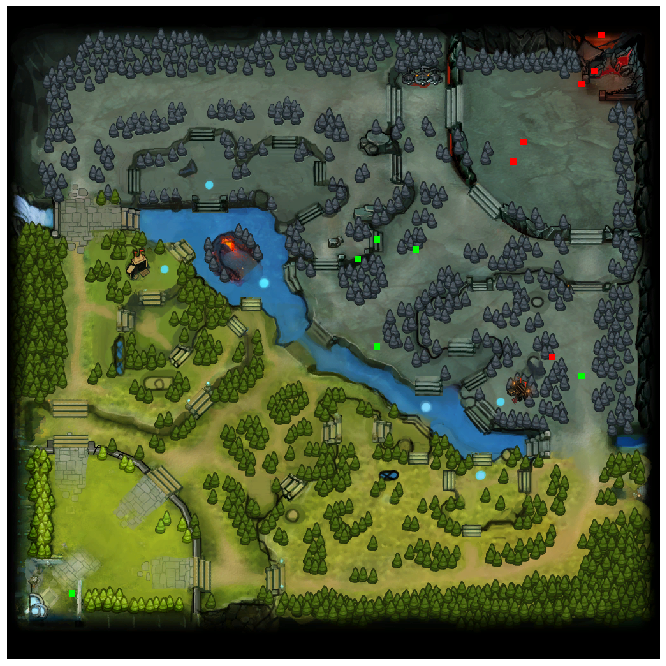

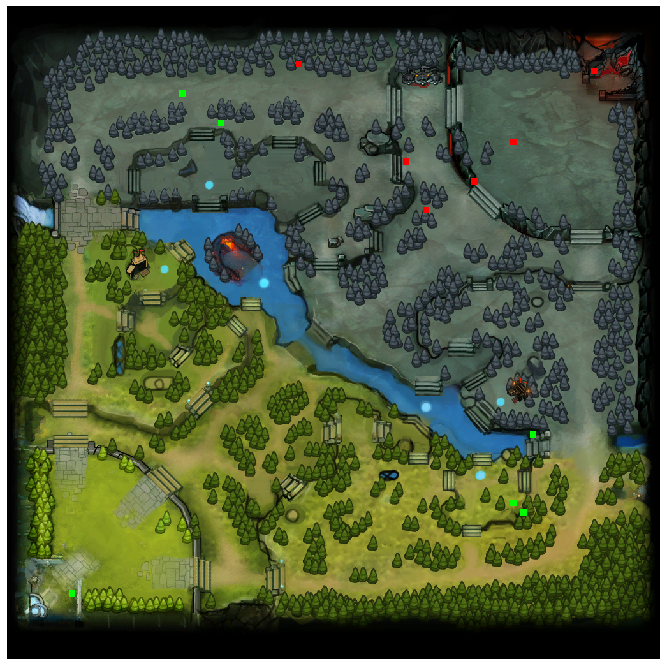

In [12]:
for i, line in enumerate(open('../data/test_matches.jsonl')):
    game = json.loads(line)
    draw_players(game['players'])
    if i > 10:
        break

In [13]:
map = np.array(Image.open('../dota_map.png'))[...,:-1]

In [14]:
scale = 1024

In [15]:
def is_top_lane(x, y):
    return x < .175 or y < .175

In [16]:
def is_mid_lane(x, y):
    return abs(x - y) < .15

In [17]:
def is_bot_lane(x, y):
    return x < .175 or y > .825

In [40]:
top_left_x = slice(0, int(scale * .175)), slice(0, scale * 1)
top_left_y = slice(0, scale * 1), slice(0, int(scale *.175))

In [ ]:
bot_x = slice(0, int(scale * ))

In [43]:
import numpy as np

In [48]:
np.diag_indices(5)

(array([0, 1, 2, 3, 4]), array([0, 1, 2, 3, 4]))

In [50]:
x = np.arange(1024)

In [85]:
150 / 1024

0.146484375

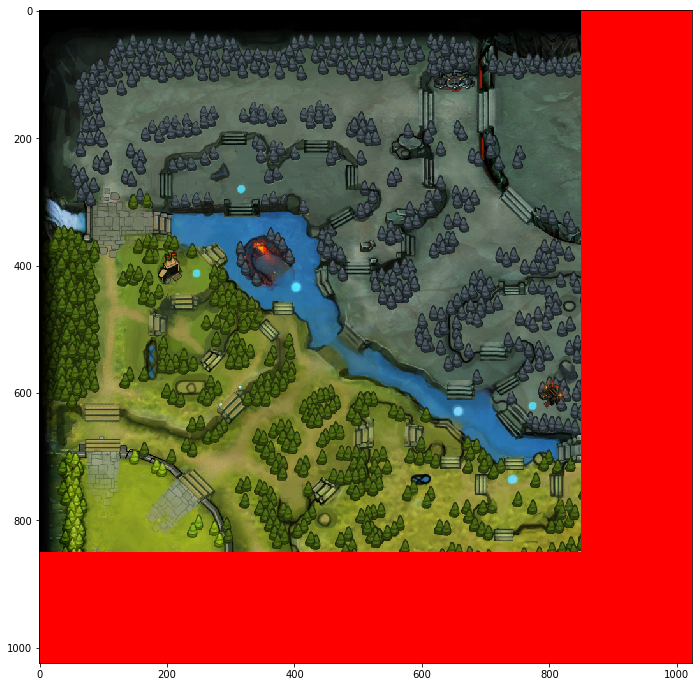

In [25]:
m = map.copy()
m[850:, :] = (255, 0, 0)
m[:, 850:] = (255, 0, 0)
# m[top_left_x] = (255, 0, 0)
# m[top_left_y] = (255, 0, 0)
plt.figure(figsize=(12, 12))
plt.imshow(m);

In [4]:
from features import pos_features

In [5]:
[pos_features(p) for p in game['players']]

[{'x': 0.14925373134328357,
  'y': 0.6865671641791045,
  'lane': 'top',
  'my_base_d': 0.5886314365919925,
  'enemy_base_d': 0.7804956984561363},
 {'x': 0.7910447761194029,
  'y': 0.208955223880597,
  'lane': 'jungle',
  'my_base_d': 0.6995813915569702,
  'enemy_base_d': 0.6995813915569702},
 {'x': 0.22388059701492538,
  'y': 0.08955223880597014,
  'lane': 'top',
  'my_base_d': 0.1243203846146794,
  'enemy_base_d': 1.055444465956077},
 {'x': 0.417910447761194,
  'y': 0.417910447761194,
  'lane': 'mid',
  'my_base_d': 0.44959326684398393,
  'enemy_base_d': 0.6817775830544921},
 {'x': 0.08955223880597014,
  'y': 0.6417910447761194,
  'lane': 'top',
  'my_base_d': 0.5418917714023405,
  'enemy_base_d': 0.8505865259820562},
 {'x': 0.8059701492537313,
  'y': 0.3582089552238806,
  'lane': 'jungle',
  'my_base_d': 0.5498901245075825,
  'enemy_base_d': 0.7517085314103756},
 {'x': 0.44776119402985076,
  'y': 0.44776119402985076,
  'lane': 'mid',
  'my_base_d': 0.6395622528343997,
  'enemy_base_d